In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import os
import sys

In [52]:
edges = 'P28_7_5_delaunay_orig_forGraphSAGE_edges.csv'
nodes = 'P28_7_5_delaunay_orig_forGraphSAGE_nodes.csv'
edges_df = pd.read_csv(edges, header=None, names=['source', 'target','type','distance'])[1:]
nodes_df = pd.read_csv(nodes, header=None, names=['id','lym','epi','fib','inf','x','y','gt'])[1:]
edges_df['source'] = edges_df['source'].astype(int)
edges_df['target'] = edges_df['target'].astype(int)
nodes_df['id'] = nodes_df['id'].astype(int)
nodes_df['lym'] = nodes_df['lym'].astype(float)
nodes_df['epi'] = nodes_df['epi'].astype(float)
nodes_df['fib'] = nodes_df['fib'].astype(float)
nodes_df['inf'] = nodes_df['inf'].astype(float)
nodes_df['x'] = nodes_df['x'].astype(float)
nodes_df['y'] = nodes_df['y'].astype(float)
edges_df['distance'] = edges_df['distance'].astype(float)

print(edges_df.head())
print(nodes_df.head())

   source  target type    distance
1       0       1    0   47.801674
2       5       0    0  104.076895
3       5       1    0   82.346828
4       7       3    0   35.735137
5       3       8    0   61.188234
   id  lym  epi  fib  inf      x      y                          gt
1   0  0.0  0.0  1.0  0.0  335.0  323.0  fibroblast and endothelial
2   1  0.0  0.0  1.0  0.0  297.0  352.0  fibroblast and endothelial
3   2  0.0  0.0  1.0  0.0  335.0  468.0  fibroblast and endothelial
4   3  0.0  0.0  1.0  0.0  357.0   20.0  fibroblast and endothelial
5   4  0.0  0.0  1.0  0.0  447.0  363.0  fibroblast and endothelial


In [53]:
nodes = nodes_df['id'].unique()
nodes = np.sort(nodes)
nodes

array([   0,    1,    2, ..., 4749, 4750, 4751])

In [54]:
nodes_df

,id,lym,epi,fib,inf,x,y,gt
1,0,0.0,0.0,1.0,0.0,335.0,323.0,fibroblast and endothelial
2,1,0.0,0.0,1.0,0.0,297.0,352.0,fibroblast and endothelial
3,2,0.0,0.0,1.0,0.0,335.0,468.0,fibroblast and endothelial
4,3,0.0,0.0,1.0,0.0,357.0,20.0,fibroblast and endothelial
5,4,0.0,0.0,1.0,0.0,447.0,363.0,fibroblast and endothelial
...,...,...,...,...,...,...,...,...
4748,4747,0.0,1.0,0.0,0.0,1547.0,1637.0,epithelial
4749,4748,0.0,0.0,1.0,0.0,1551.0,1782.0,fibroblast and endothelial
4750,4749,0.0,1.0,0.0,0.0,1660.0,1828.0,epithelial
4751,4750,0.0,1.0,0.0,0.0,1801.0,1812.0,epithelial


In [55]:
# visualize graph
import networkx as nx
G = nx.Graph()
#G.add_nodes_from(nodes,)
for index, row in nodes_df.iterrows():
    G.add_node(row['id'], type=row['gt'], coords=(row['x'], row['y']))


#G.add_edges_from(edges_df[['source', 'target']].values, )

for u,v,d in edges_df[['source', 'target', 'type']].values:
    G.add_edge(u, v, label=d)

In [56]:
nodes_df['gt'].unique()

array(['fibroblast and endothelial', 'lymphocyte', 'inflammatory',
       'epithelial'], dtype=object)

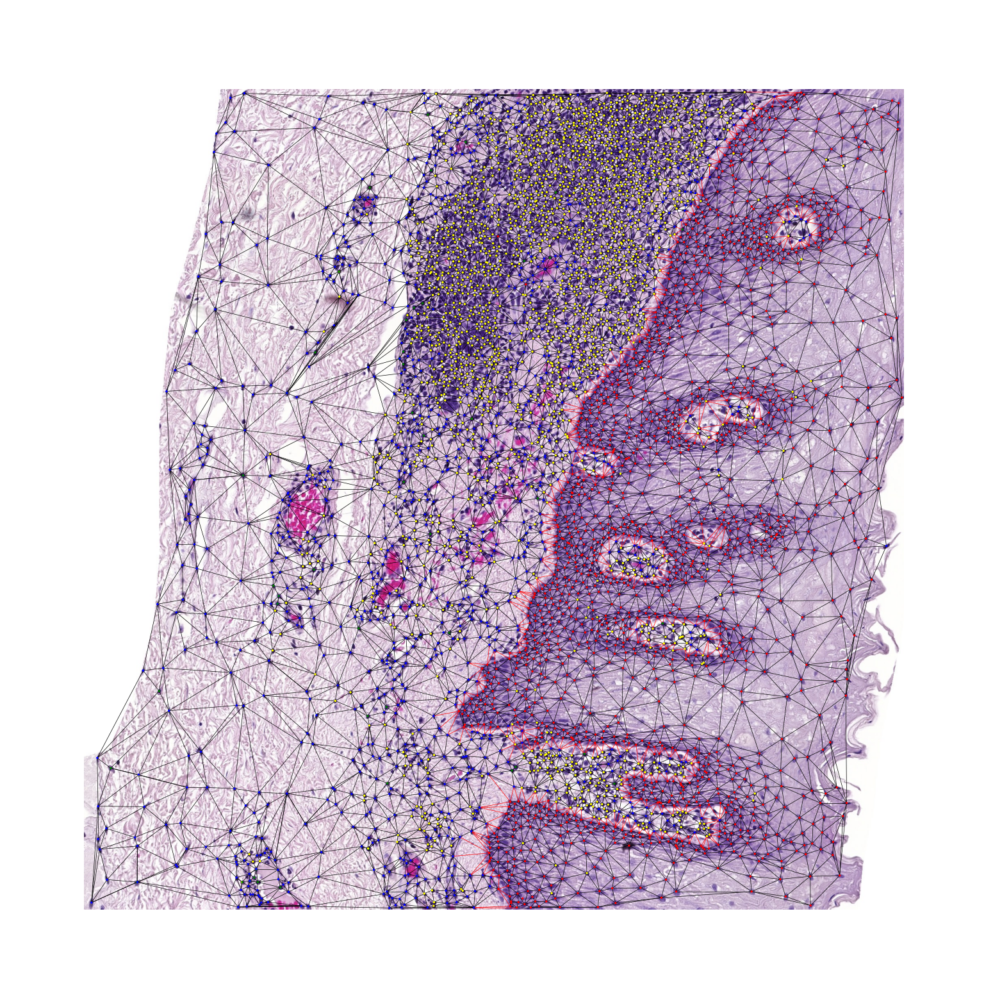

In [57]:
# Load and preprocess the image
image_path = 'P28_7_5.tif' 
image = plt.imread(image_path)
image = image[:, :, 0:3]

# Create a figure and axis object
fig, ax = plt.subplots()

# Figure size 20,20
fig.set_size_inches(20, 20)


# Plot the image
ax.imshow(image)

pos = nodes_df[['x', 'y']].values

gt = nodes_df['gt'].values
color = {'epithelial': 'red', 'fibroblast and endothelial': 'blue', 'inflammatory': 'green', 'lymphocyte': 'yellow'}
edge_color = {0:'black', 1: 'red'}#
edge_types = edges_df['type'].values
edge_colors = [edge_color[int(label)] for u, v, label in G.edges.data('label')]

nx.draw(G, pos, node_size=2, width= 0.5, node_color=[color[gt[i]] for i in range(len(gt))], edge_color=edge_colors )

# [1.5 if int(edge_types[i]) else 0.5 for i in range(len(edge_types)) ]
# [edge_color[int(edge_types[i])] for i in range(len(edge_types))]

# Plot the graph on top of the image
#nx.draw_networkx(G, pos, with_labels=False, node_size=1, edge_color='red', node_color='red', ax=ax)

# Remove the axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()

In [59]:
import pandas as pd
import networkx as nx
from itertools import combinations
 
# Find all triangles
triangles = []
for node in G.nodes:
    neighbors = list(G.neighbors(node))
    for u, v in combinations(neighbors, 2):
        if G.has_edge(u, v):
            triangles.append(sorted([node, u, v]))

# Remove duplicate triangles
unique_triangles = [list(x) for x in set(tuple(x) for x in triangles)]

# Create a pandas DataFrame
triangle_df = pd.DataFrame(unique_triangles, columns=['Node1', 'Node2', 'Node3'])
print(triangle_df)

      Node1  Node2  Node3
0      2219   2397   2570
1      3270   3358   3470
2      1116   1173   1283
3      4374   4583   4609
4      3262   3400   3477
...     ...    ...    ...
9470   2203   2671   2685
9471   2173   2305   2724
9472   3987   4008   4049
9473   2782   2802   2868
9474   2251   2259   2520

[9475 rows x 3 columns]


In [94]:
edges_df['type'] = edges_df['type'].astype(int)

In [98]:
edges_df[(edges_df['source'] == 2397) & (edges_df['target'] == 2219)|
         (edges_df['source'] == 2219) & (edges_df['target'] == 2397)]['type'].values

array([0])

In [109]:
for idx, row in triangle_df.iterrows():
    node1_xy = nodes_df.loc[nodes_df['id'] == row['Node1'], ['x','y']].iloc[0].values
    node2_xy = nodes_df.loc[nodes_df['id'] == row['Node2'], ['x','y']].iloc[0].values
    node3_xy = nodes_df.loc[nodes_df['id'] == row['Node3'], ['x','y']].iloc[0].values
 

    triangle_df.loc[idx, ['x1','y1']] = node1_xy
    triangle_df.loc[idx, ['x2','y2']] = node2_xy
    triangle_df.loc[idx, ['x3','y3']] = node3_xy

    count = 0
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node2']) | 
             (edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        count +=1
    if edges_df[(edges_df['source'] == row['Node1']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node1'])]['type'].values[0] == 1:
        count +=1    
    if edges_df[(edges_df['source'] == row['Node2']) & (edges_df['target'] == row['Node3']) |
                (edges_df['source'] == row['Node3']) & (edges_df['target'] == row['Node2'])]['type'].values[0] == 1:
        count +=1
        
    
    triangle_df.loc[idx, ['count']] = count

triangle_df

,Node1,Node2,Node3,x1,y1,x2,y2,x3,y3,count
0,2219,2397,2570,1386.0,607.0,1370.0,607.0,1380.0,617.0,0.0
1,3270,3358,3470,1484.0,1404.0,1437.0,1417.0,1469.0,1390.0,0.0
2,1116,1173,1283,1418.0,325.0,1428.0,301.0,1441.0,334.0,0.0
3,4374,4583,4609,1117.0,1570.0,1104.0,1580.0,1117.0,1580.0,0.0
4,3262,3400,3477,1471.0,1068.0,1507.0,1059.0,1483.0,1052.0,0.0
...,...,...,...,...,...,...,...,...,...,...
9470,2203,2671,2685,1067.0,804.0,1086.0,822.0,1094.0,813.0,0.0
9471,2173,2305,2724,1248.0,964.0,1266.0,946.0,1251.0,943.0,2.0
9472,3987,4008,4049,830.0,1961.0,809.0,1972.0,814.0,1937.0,0.0
9473,2782,2802,2868,1617.0,805.0,1620.0,794.0,1596.0,785.0,0.0


In [103]:
#

,Node1,Node2,Node3,x1,y1,x2,y2,x3,y3,count
0,2219,2397,2570,1386.0,607.0,1370.0,607.0,1380.0,617.0,0.0
1,3270,3358,3470,1484.0,1404.0,1437.0,1417.0,1469.0,1390.0,0.0
2,1116,1173,1283,1418.0,325.0,1428.0,301.0,1441.0,334.0,0.0
3,4374,4583,4609,1117.0,1570.0,1104.0,1580.0,1117.0,1580.0,0.0
4,3262,3400,3477,1471.0,1068.0,1507.0,1059.0,1483.0,1052.0,0.0
...,...,...,...,...,...,...,...,...,...,...
9469,351,1904,2026,967.0,498.0,981.0,526.0,989.0,520.0,0.0
9470,2203,2671,2685,1067.0,804.0,1086.0,822.0,1094.0,813.0,0.0
9472,3987,4008,4049,830.0,1961.0,809.0,1972.0,814.0,1937.0,0.0
9473,2782,2802,2868,1617.0,805.0,1620.0,794.0,1596.0,785.0,0.0


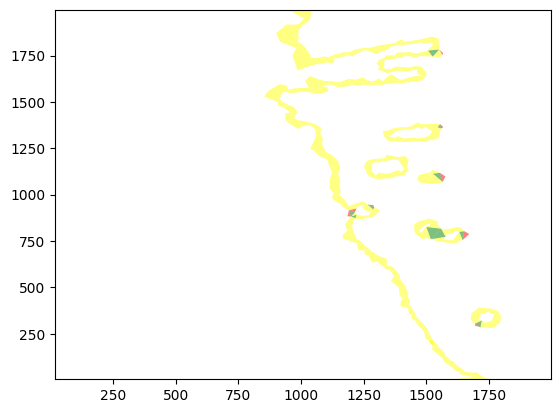

In [110]:
import matplotlib.patches as patches
# Filter triangles with count greater than 0
filtered_triangles = triangle_df[triangle_df['count'] > 0]

# Create a figure and axis object
fig, ax = plt.subplots()

# Plot each triangle with different colors based on count
for _, row in filtered_triangles.iterrows():
    x1, y1, x2, y2, x3, y3 = row['x1'], row['y1'], row['x2'], row['y2'], row['x3'], row['y3']
    count = row['count']
    if count == 3:
        color = 'green'
    elif count == 2:
        color = 'yellow'
    else:
        color = 'red'
    triangle = patches.Polygon([(x1, y1), (x2, y2), (x3, y3)], closed=True, facecolor=color, alpha=0.5)
    ax.add_patch(triangle)

# Set the limits of the plot
x_min, x_max = triangle_df[['x1', 'x2', 'x3']].min().min() - 1, triangle_df[['x1', 'x2', 'x3']].max().max() + 1
y_min, y_max = triangle_df[['y1', 'y2', 'y3']].min().min() - 1, triangle_df[['y1', 'y2', 'y3']].max().max() + 1
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Display the plot
plt.show()

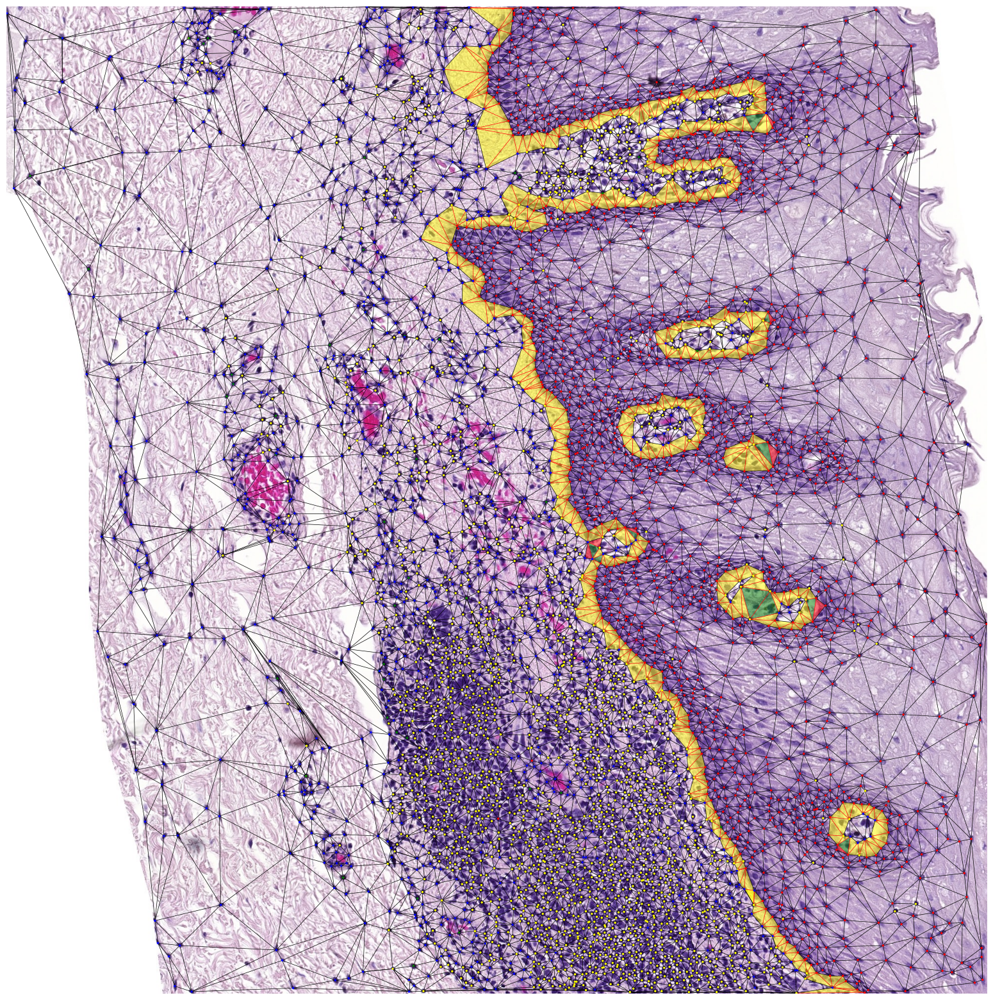

In [111]:
# Load and preprocess the image
image_path = 'P28_7_5.tif' 
image = plt.imread(image_path)
image = image[:, :, 0:3]

# Create a figure and axis object
fig, ax = plt.subplots()

# Figure size 20,20
fig.set_size_inches(20, 20)


# Plot the image
ax.imshow(image)


filtered_triangles = triangle_df[triangle_df['count'] > 0]

for _, row in filtered_triangles.iterrows():
    x1, y1, x2, y2, x3, y3 = row['x1'], row['y1'], row['x2'], row['y2'], row['x3'], row['y3']
    count = row['count']
    if count == 3:
        color = 'green'
    elif count == 2:
        color = 'yellow'
    else:
        color = 'red'
    triangle = patches.Polygon([(x1, y1), (x2, y2), (x3, y3)], closed=True, facecolor=color, alpha=0.5)
    ax.add_patch(triangle)

# Set the limits of the plot
x_min, x_max = triangle_df[['x1', 'x2', 'x3']].min().min() - 1, triangle_df[['x1', 'x2', 'x3']].max().max() + 1
y_min, y_max = triangle_df[['y1', 'y2', 'y3']].min().min() - 1, triangle_df[['y1', 'y2', 'y3']].max().max() + 1
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)




pos = nodes_df[['x', 'y']].values

gt = nodes_df['gt'].values
color = {'epithelial': 'red', 'fibroblast and endothelial': 'blue', 'inflammatory': 'green', 'lymphocyte': 'yellow'}
edge_color = {0:'black', 1: 'red'}#
edge_types = edges_df['type'].values
edge_colors = [edge_color[int(label)] for u, v, label in G.edges.data('label')]

nx.draw(G, pos, node_size=2, width= 0.5, node_color=[color[gt[i]] for i in range(len(gt))], edge_color=edge_colors )

# [1.5 if int(edge_types[i]) else 0.5 for i in range(len(edge_types)) ]
# [edge_color[int(edge_types[i])] for i in range(len(edge_types))]

# Plot the graph on top of the image
#nx.draw_networkx(G, pos, with_labels=False, node_size=1, edge_color='red', node_color='red', ax=ax)

# Remove the axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])

# Display the plot
plt.show()

In [27]:

# Add node features to the triangle DataFrame
for idx, row in triangle_df.iterrows():
    node1_gt = nodes_df.loc[nodes_df['id'] == row['Node1'], 'gt'].iloc[0]
    node2_gt = nodes_df.loc[nodes_df['id'] == row['Node2'], 'gt'].iloc[0]
    node3_gt = nodes_df.loc[nodes_df['id'] == row['Node3'], 'gt'].iloc[0]

    triangle_df.loc[idx, 'Node1_gt'] = node1_gt
    triangle_df.loc[idx, 'Node2_gt'] = node2_gt
    triangle_df.loc[idx, 'Node3_gt'] = node3_gt
print(triangle_df)

      Node1  Node2  Node3    Node1_gt                    Node2_gt  \
0      2219   2397   2570  epithelial                  epithelial   
1      3270   3358   3470  epithelial                  epithelial   
2      1116   1173   1283  lymphocyte  fibroblast and endothelial   
3      4374   4583   4609  epithelial                  epithelial   
4      3262   3400   3477  epithelial                  epithelial   
...     ...    ...    ...         ...                         ...   
9470   2203   2671   2685  lymphocyte  fibroblast and endothelial   
9471   2173   2305   2724  epithelial                  epithelial   
9472   3987   4008   4049  lymphocyte  fibroblast and endothelial   
9473   2782   2802   2868  lymphocyte                  lymphocyte   
9474   2251   2259   2520  epithelial                  epithelial   

                        Node3_gt  
0                     epithelial  
1                     epithelial  
2     fibroblast and endothelial  
3                     epithelia

In [11]:
from collections import defaultdict


# Find all triangles
triangles_count = defaultdict(int)
for node in G.nodes:
    neighbors = list(G.neighbors(node))
    count = 0
    for u, v in combinations(neighbors, 2):
        if G.has_edge(u, v):
            count += 1
    triangles_count[count] += 1

# Print the number of nodes having 1, 2, 3, 4, 5, ... triangles
for k, v in triangles_count.items():
    print(f"Nodes with {k} triangles: {v}")

Nodes with 4 triangles: 368
Nodes with 3 triangles: 47
Nodes with 2 triangles: 3
Nodes with 6 triangles: 1577
Nodes with 7 triangles: 932
Nodes with 5 triangles: 1308
Nodes with 9 triangles: 112
Nodes with 8 triangles: 354
Nodes with 10 triangles: 32
Nodes with 12 triangles: 2
Nodes with 11 triangles: 7
Nodes with 1 triangles: 5
Nodes with 0 triangles: 4
Nodes with 14 triangles: 1


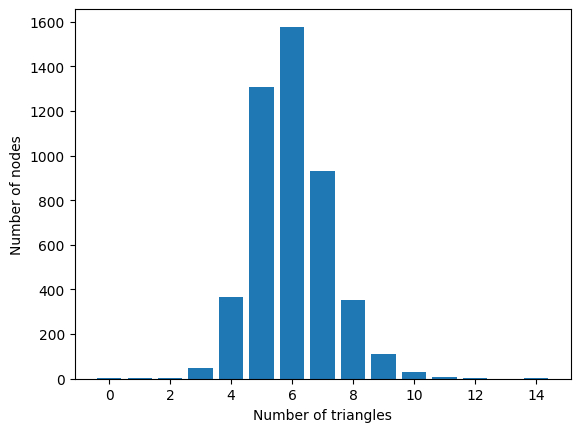

In [12]:
# Plot the distribution of the number of triangles
plt.bar(triangles_count.keys(), triangles_count.values())
plt.xlabel("Number of triangles")
plt.ylabel("Number of nodes")
plt.show()

In [15]:

# Basic graph properties
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
density = nx.density(G)

print(f"Number of nodes: {num_nodes}")
print(f"Number of edges: {num_edges}")
print(f"Density: {density:.4f}")

# Degree statistics
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
degree_count = {d: degree_sequence.count(d) for d in degree_sequence}
avg_degree = sum(degree_sequence) / num_nodes

print("Degree distribution:")
for degree, count in degree_count.items():
    print(f"Degree {degree}: {count}")
print(f"Average degree: {avg_degree:.4f}")

# Path statistics
#avg_shortest_path_length = nx.average_shortest_path_length(G)
#diameter = nx.diameter(G)

#print(f"Average shortest path length: {avg_shortest_path_length:.4f}")
#print(f"Diameter: {diameter}")

# Clustering
"""clustering_coefficients = nx.clustering(G)
avg_clustering_coefficient = nx.average_clustering(G)

print("Clustering coefficients:")
for node, coeff in clustering_coefficients.items():
    print(f"Node {node}: {coeff:.4f}")
print(f"Average clustering coefficient: {avg_clustering_coefficient:.4f}")

# Centrality
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G)

print("Degree centrality:")
for node, centrality in degree_centrality.items():
    print(f"Node {node}: {centrality:.4f}")

print("Betweenness centrality:")
for node, centrality in betweenness_centrality.items():
    print(f"Node {node}: {centrality:.4f}")

print("Eigenvector centrality:")
for node, centrality in eigenvector_centrality.items():
    print(f"Node {node}: {centrality:.4f}")"""

Number of nodes: 4752
Number of edges: 14185
Density: 0.0013
Degree distribution:
Degree 12: 2
Degree 11: 7
Degree 10: 20
Degree 9: 101
Degree 8: 343
Degree 7: 958
Degree 6: 1593
Degree 5: 1307
Degree 4: 371
Degree 3: 41
Degree 2: 5
Degree 0: 4
Average degree: 5.9701
Clustering coefficients:
Node 0: 0.6667
Node 1: 0.5000
Node 2: 0.6667
Node 3: 0.6667
Node 4: 0.4000
Node 5: 0.3333
Node 6: 0.4000
Node 7: 0.3333
Node 8: 0.6667
Node 9: 0.2857
Node 10: 0.6667
Node 11: 0.2500
Node 12: 0.4000
Node 13: 0.4000
Node 14: 0.5000
Node 15: 0.3333
Node 16: 0.5000
Node 17: 0.4000
Node 18: 0.3333
Node 19: 0.5000
Node 20: 0.2857
Node 21: 0.4000
Node 22: 0.4000
Node 23: 0.5000
Node 24: 0.5000
Node 25: 0.6667
Node 26: 0.4000
Node 27: 0.2222
Node 28: 0.6667
Node 29: 0.4000
Node 30: 0.5000
Node 31: 0.5000
Node 32: 0.2857
Node 33: 0.3333
Node 34: 0.5000
Node 35: 0.4000
Node 36: 0.4000
Node 37: 0.4000
Node 38: 0.5000
Node 39: 0.3333
Node 40: 0.4000
Node 41: 0.5000
Node 42: 0.5000
Node 43: 0.3810
Node 44: 0.33

KeyboardInterrupt: 

In [20]:
def add_image_on_node(ax, xy, im, zoom=1):
    im = OffsetImage(im, zoom=zoom)
    ab = AnnotationBbox(im, xy, frameon=False)
    ax.add_artist(ab)

In [21]:
from PIL import Image
image = Image.open('P28_7_5.tif')

In [14]:
nodes_df[['x', 'y']].values

array([[ 335.,  323.],
       [ 297.,  352.],
       [ 335.,  468.],
       ...,
       [1660., 1828.],
       [1801., 1812.],
       [1552., 1649.]])

In [22]:
fig, ax = plt.subplots(figsize=(10, 10))

# Display the image
ax.imshow(image, aspect='auto', extent=[0, image.size[0], 0, image.size[1]])

# Draw the graph
#pos = {node: (data['coords'][0], data['coords'][1]) for node, data in G.nodes(data=True)}

# You can customize the appearance of the graph using additional parameters in the nx.draw function
nx.draw(G, pos, ax=ax, node_size=10, node_color='r', edge_color='black', with_labels=True, font_size=10)

# Add the image on each node
for node, data in G.nodes(data=True):
    add_image_on_node(ax, data['coords'], image, zoom=0.1)

plt.show()

MemoryError: Unable to allocate 11.4 MiB for an array with shape (2000, 2000, 3) and data type bool

In [115]:
# node degree distribution
node0 = 388
G.degree[node0]

2

In [116]:
# Get subgraph from given node
def get_subgraph(G, node, radius):
    subgraph = nx.ego_graph(G, node, radius=radius, center=True, undirected=True, distance=None)
    return subgraph

subgraph1 = get_subgraph(G, node0, 1)
subgraph2 = get_subgraph(G, node0, 2)
subgraph3 = get_subgraph(G, node0, 3)

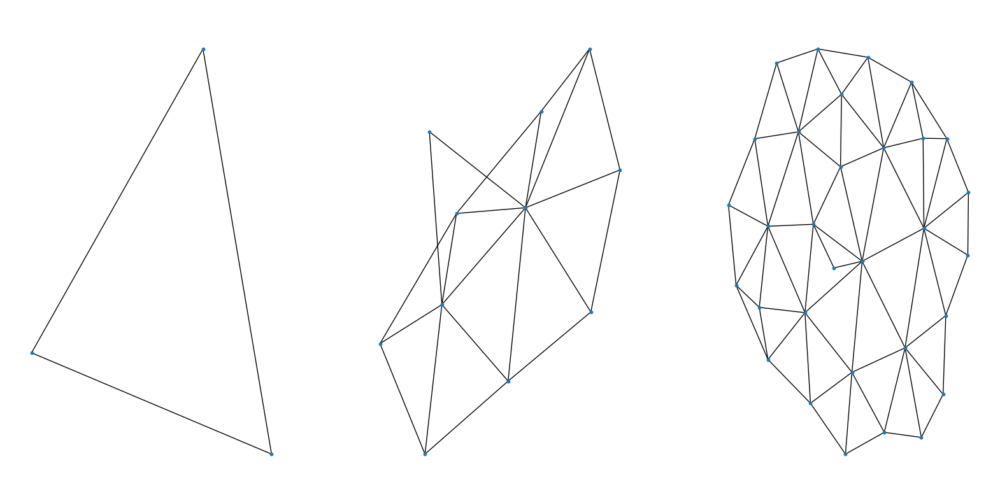

In [126]:
# Plot 3 subgraphs
plt.figure(figsize=(20,10))
plt.subplot(1,3,1)
nx.draw(subgraph1, node_size = 10)
plt.subplot(1,3,2)
nx.draw(subgraph2, node_size = 10)
plt.subplot(1,3,3)
nx.draw(subgraph3, node_size = 10)

In [8]:
nodes_degree = G.degree()

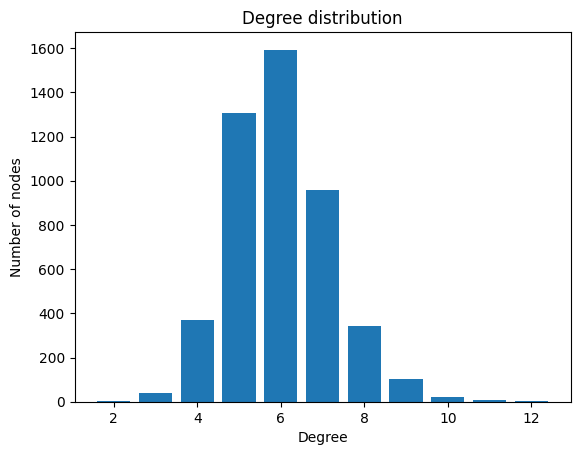

In [9]:
# Count node with same degree
degree_count = {}
for node, degree in nodes_degree:
    if degree not in degree_count:
        degree_count[degree] = 0
    degree_count[degree] += 1

# Plot degree distribution
plt.bar(degree_count.keys(), degree_count.values())
plt.xlabel('Degree')
plt.ylabel('Number of nodes')
plt.title('Degree distribution')
plt.show()

In [10]:
# show adjacency matrix
adj = nx.adjacency_matrix(G)
adj = adj.todense()
adj

C:\Users\andre\AppData\Local\Temp\ipykernel_23784\2649149202.py:2: FutureWarning: adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
  adj = nx.adjacency_matrix(G)


matrix([[0, 1, 0, ..., 0, 0, 0],
        [1, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

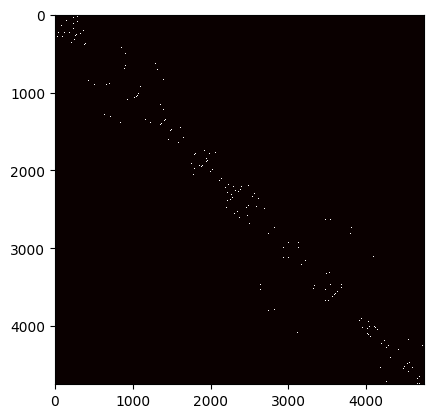

In [11]:
# plot adjacency matrix
plt.imshow(adj, cmap='hot', interpolation='nearest')
plt.show()


In [19]:
import itertools
target = nx.complete_graph(4)
for sub_nodes in itertools.combinations(G.nodes(),len(target.nodes())):
    subg = G.subgraph(sub_nodes)
    if nx.is_connected(subg) and nx.is_isomorphic(subg, target):
        print(subg.edges())

KeyboardInterrupt: 

In [21]:
number_of_triangles = sum(nx.triangles(G).values()) / 3
number_of_triangles

9475.0

In [ ]:
# Graph G is built from the edges of the Delaunay triangulation of the points in the plane
# Create its dual graph G*

